# CNN-based Brain Tumour Segmentation Network
## Import packages
Please make sure you have all the required packages installed. If GPU is available, but you want to use CPU to train your model, make sure you add " os.environ['CUDA_VISIBLE_DEVICES'] = '-1'.
Package 'SimpleITK' is for loading the MR images, so you need to install it first.

In [1]:
import numpy as np
import shutil
import os
import tensorflow as tf
import random
from matplotlib import pyplot as plt
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping
#os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
train_list = []
val_list = []

## Split your dataset into training and validation
Validation dataset would not be used to train your network, it is normally for evaluating your model performance and choosing the best set of hyperparameters. Choose the size of your training and validation set yourself.

In [2]:
!rmdir Train Val /s /q
!md Train Val Train\Yes Train\No Val\Yes Val\No


def split_data():
    #import random
    img_path = 'Dataset/'
    CLASS = 'Yes'
    all_files = os.listdir(img_path + CLASS)
    files = [item for item in all_files if "img" in item]
    #random.shuffle(files)
    img_num = len(files)
    global train_list
    global val_list
    train_list = []
    val_list = []
    for (n, file_name) in enumerate(files):
        img = os.path.join(img_path, CLASS, file_name)
        seg = os.path.join(img_path, CLASS, file_name.split('_')[0] + '_seg.npy')
        # 80% of images will be used for training, change the number here
        # to use different number of images for training your model.
        if n < 0.8 * img_num:
            shutil.copy(img, os.path.join('Train\\', CLASS, file_name))
            train_list.append(os.path.join('Train\\', CLASS, file_name))
            shutil.copy(seg, os.path.join('Train\\', CLASS, file_name.split('_')[0] + '_seg.npy'))
        else:
            shutil.copy(img, os.path.join('Val\\', CLASS, file_name))
            val_list.append(os.path.join('Val\\', CLASS, file_name))
            shutil.copy(seg, os.path.join('Val\\', CLASS, file_name.split('_')[0] + '_seg.npy'))


# def get_data_list():
#     img_path = 'Dataset/'
#     CLASS = 'Yes'
#     all_files = os.listdir(img_path + CLASS)
#     files = [item for item in all_files if "img" in item]
#     # random.shuffle(files)
#     img_num = len(files)
#     for (n, file_name) in enumerate(files):
#         img = os.path.join(img_path, CLASS, file_name)
#         seg = os.path.join(img_path, CLASS, file_name.split('_')[0] + '_seg.npy')
#         # 80% of images will be used for training, change the number here
#         # to use different number of images for training your model.
#         if n < 0.8 * img_num:
#             train_list.append(os.path.join('Train\\', CLASS, file_name))
#         else:
#             val_list.append(os.path.join('Val\\', CLASS, file_name))


split_data()

## Visualise MRI Volume Slices and Segmentation Maps
Each MRI image contains information about a three-dimensional (3D) volume of space. An MRI image is composed of a number of voxels, which is like pixels in 2D images. Here we visualise the transverse plane (usually has a higher resolution) of some of the volumes and the corresponding segmentation maps.

## Data preprocessing (Optional)

Images in the original dataset are usually in different sizes, so sometimes we need to resize and normalise (z-score is commonly used in preprocessing the MRI images) them to fit the CNN model. Depending on the images you choose to use for training your model, some other preprocessing methods. If preprocessing methods like cropping is applied, remember to convert the segmentation result back to its original size. 

## Train-time data augmentation
Generalizability is crucial to a deep learning model and it refers to the performance difference of a model when evaluated on the seen data (training data) versus the unseen data (testing data). Improving the generalizability of these models has always been a difficult challenge. 

**Data Augmentation** is an effective way of improving the generalizability, because the augmented data will represent a more comprehensive set of possible data samples and minimizing the distance between the training and validation/testing sets.

There are many data augmentation methods you can choose in this projects including rotation, shifting, flipping, etc.

You are encouraged to try different augmentation method to get the best segmentation result.

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(brightness_range=(0.9,1.1),
                                   zoom_range=[.9,1.1],
                                   fill_mode='nearest')

## Get the data generator ready

In [14]:
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'

    def __init__(self, list_IDs, batch_size, dim=(240, 240), n_channels=3, shuffle=False):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.on_epoch_end()
        self.batch_ID=[]

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        self.batch_ID = list_IDs_temp

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)
        return X, y

    def __batchID__(self):
        return self.batch_ID
    
    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        """Generates data containing batch_size samples"""  # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim))
        # y = np.empty((self.batch_size), dtype=int)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            # Add data augmentation here
            X[i, ] = np.load(ID)
            y[i, ] = np.load(ID.split('_')[0] + '_seg.npy')
            # print(y[i,])
            # y[i] = min(1, np.sum(np.load(ID.split('_')[0] + '_seg.npy')))
        from keras.preprocessing.image import ImageDataGenerator
        train_datagen = ImageDataGenerator(brightness_range=(0.9,1.1),
                                   zoom_range=[.9,1.1],
                                   fill_mode='nearest')
        return X, y


train_generator = DataGenerator(train_list,6)
validation_generator = DataGenerator(val_list,6)
# data=train_generator.__getitem__(0)
# print(train_generator.__getitem__(0))

## Define a metric for the performance of the model
Dice score is used here to evaluate the performance of your model.
More details about the Dice score and other metrics can be found at 
https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2. Dice score can be also used as the loss function for training your model.

In [6]:
from tensorflow.keras import backend as K

def iou_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def Loss(y_true, y_pred):
    return -iou_coef(y_true, y_pred)

## Build your own model here
The U-Net (https://link.springer.com/chapter/10.1007/978-3-319-24574-4_28) structure is widely used for the medical image segmentation task. You can build your own model or modify the UNet by changing the hyperparameters for our task. If you choose to use Keras, more information about the Keras layers including Conv2D, MaxPooling and Dropout can be found at https://keras.io/api/layers/.

In [5]:
#unet model
def unet(pretrained_weights=None, input_size=(240, 240, 3)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
        UpSampling2D(size=(2, 2))(drop5))  # 上采样之后再进行卷积，相当于转置卷积操作！
    merge6 = concatenate([drop4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

    up7 = Conv2D(256, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
        UpSampling2D(size=(2, 2))(conv6))
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

    up8 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
        UpSampling2D(size=(2, 2))(conv7))
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)

    up9 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
        UpSampling2D(size=(2, 2))(conv8))
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
    conv9 = Conv2D(2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)  # 我怀疑这个sigmoid激活函数是多余的，因为在后面的loss中用到的就是二进制交叉熵，包含了sigmoid
    model = Model(inputs=inputs, outputs=conv10)

    model.compile(optimizer=Adam(lr=1e-3), loss= Loss, metrics=[iou_coef])

#     if (pretrained_weights):
#         model.load_weights(pretrained_weights)
    return model

## Train your model here
Once you defined the model and data generator, you can start training your model.

In [6]:
model = unet()
earlystopping = EarlyStopping(
    monitor=iou_coef,
    mode='max',
    patience=20  # 若精度在20轮内不改善，则中止
)
#model_checkpoint = ModelCheckpoint('unet_membrane.hdf5', monitor=Loss, verbose=1, save_best_only=True)
history=model.fit(train_generator, epochs=1,validation_data=validation_generator, callbacks=[earlystopping])

E:\Anaconda\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


222/222 [==============================] - 134s 535ms/step - loss: -0.0522 - iou_coef: 0.0522 - val_loss: -0.0514 - val_iou_coef: 0.0514


In [1]:
acc = history.history['iou_coef']
val_acc = history.history['val_iou_coef']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Validation Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('dice')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Validation Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')
plt.show()

NameError: name 'history' is not defined

## Save the model
Once your model is trained, remember to save it for testing.

In [7]:
model.save("trained_seg_model.h5")

## Run the model on the test set
After your last Q&A session, you will be given the test set. Run your model on the test set to get the segmentation results and submit your results in a .zip file. If the MRI image is named '100_img.npy', save your segmentation result as '100_seg.npy'. 

In [13]:
import keras
import numpy
from numpy import *
# config = tf.compat.v1.ConfigProto(allow_soft_placement=True)

# config.gpu_options.per_process_gpu_memory_fraction = 0.3
# tf.compat.v1.keras.backend.set_session(tf.compat.v1.Session(config=config))



test_dir = 'Val/'
#load your model here
model = tf.keras.models.load_model('trained_seg_model.h5', compile = False)
# model = tf.keras.models.load_model("my_model")
# model = load_model('trained_model.h5')
test_list = []
CLASS='Yes'
all_files = os.listdir(test_dir + CLASS)
files = [item for item in all_files if "img" in item]
for file_name in files:
    test_list.append(test_dir + CLASS + '/' + file_name)
    test_generator = DataGenerator(test_list, batch_size=1)

import matplotlib.pyplot as plt

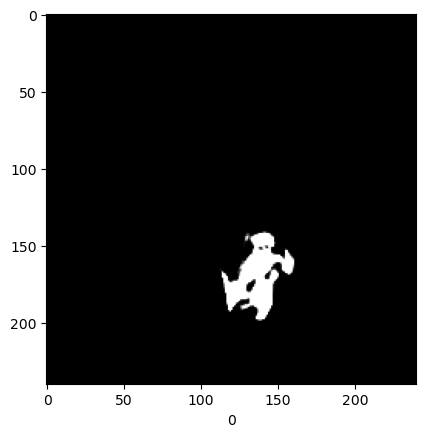

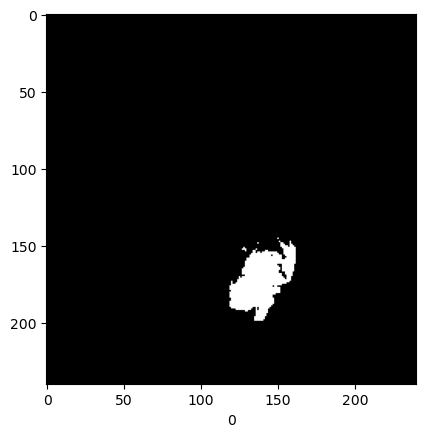

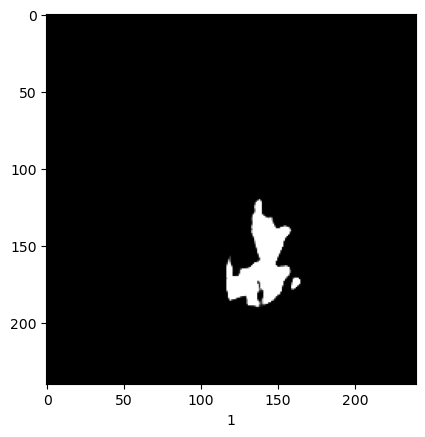

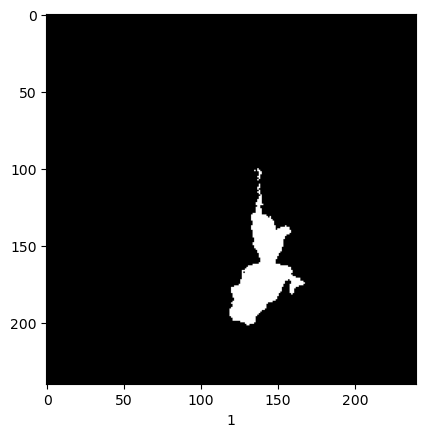

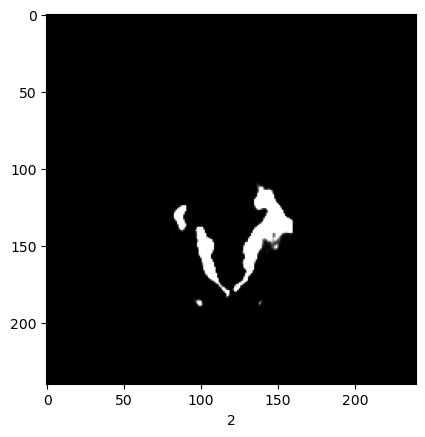

...

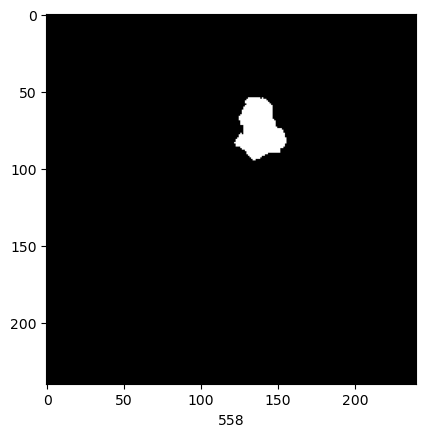

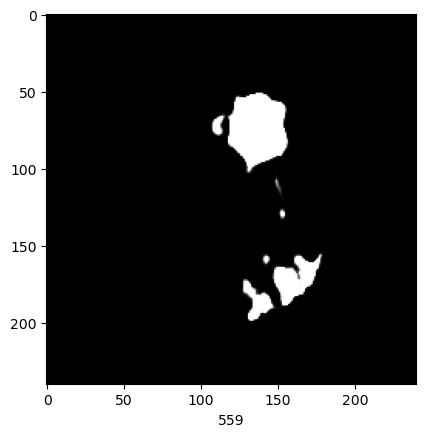

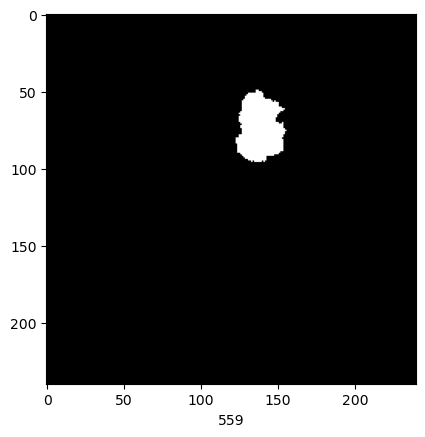

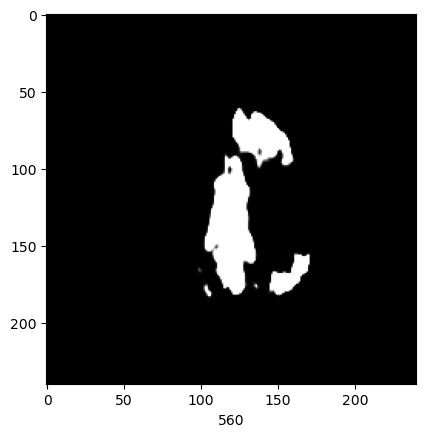

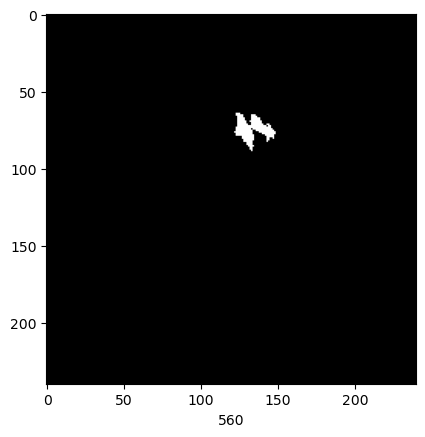

In [ ]:
import matplotlib.pyplot as plt
y_test = []
accuracies=[]
THRESHOLD = 0.2
!rmdir Save /s /q
!md Save
#build dir
for i in range(test_generator.__len__()):    #loop between batches
    y = test_generator.__getitem__(i)[1]
    predicted=model.predict(test_generator.__getitem__(i)[0])    #get data for one batch
    idlist=test_generator.__batchID__()    #get IDs for one batch
    for idx in range(test_generator.batch_size):    #loop within a batch
        predicted_mask= (predicted[idx,:,:,0]>THRESHOLD)*1    #shape=(240,240)
        Id=idlist[idx].split('_')[0]+'_seg'
        ID=Id.split('/')[2]    #get ID for a single file
        np.save(os.path.join('Save/',ID),predicted_mask)    #save file
        
        plt.imshow(predicted[0], cmap='gray' )
        plt.xlabel(i)
        plt.show()
        plt.imshow(y[0], cmap='gray' )
        plt.xlabel(i)
        plt.show()
        #plot images
    accuracies.append(iou_coef(tf.cast(y,tf.float32),tf.cast(predicted,tf.float32)))
accuracy = mean(accuracies)
print('Test iou_coef = %.2f' % accuracy)
